In [ ]:
!pip install ydata_profiling

In [ ]:

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score , precision_score, recall_score, f1_score , ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, Normalizer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
import zipfile
from imblearn.under_sampling import RandomUnderSampler
from sklearn.decomposition import PCA
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier , AdaBoostClassifier
from sklearn.ensemble import IsolationForest
from sklearn.svm import SVC
from ydata_profiling import ProfileReport
import plotly.express as px
from scipy import stats


In [ ]:
df = pd.read_csv('/content/waze_dataset.csv')

In [ ]:
df.head(10)

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device
0,0,retained,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android
1,1,retained,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11,iPhone
2,2,retained,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android
3,3,retained,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone
4,4,retained,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android
5,5,retained,113,103,279.544437,2637,0,0,901.238699,439.101397,15,11,iPhone
6,6,retained,3,2,236.725314,360,185,18,5249.172828,726.577205,28,23,iPhone
7,7,retained,39,35,176.072845,2999,0,0,7892.052468,2466.981741,22,20,iPhone
8,8,retained,57,46,183.532018,424,0,26,2651.709764,1594.342984,25,20,Android
9,9,churned,84,68,244.802115,2997,72,0,6043.460295,2341.838528,7,3,iPhone


In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

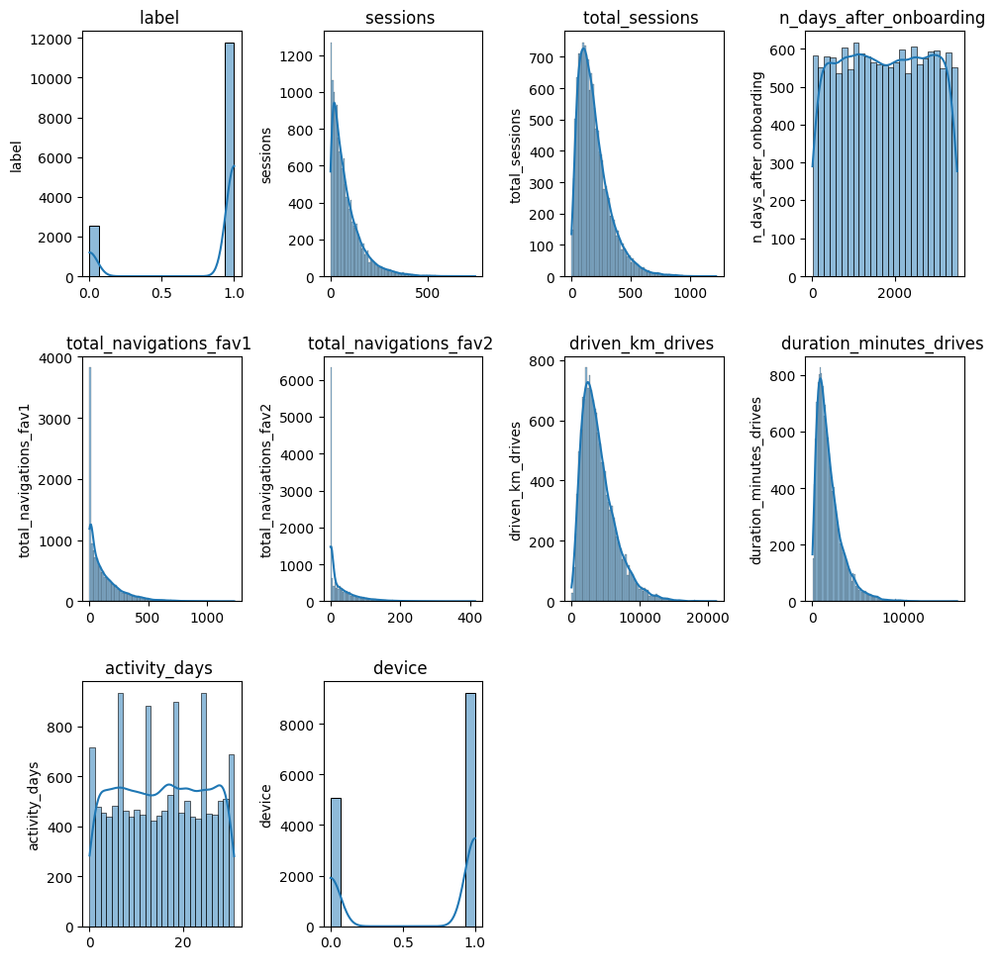

In [ ]:
num_cols = 4  # Number of columns in the subplot grid
num_rows = int(np.ceil(len(df_cleaned.columns) / num_cols))
plt.figure(figsize=(10, 10))
for i, feature in enumerate(df_cleaned.columns):
    plt.subplot(num_rows, num_cols, i+1)
    sns.histplot(data=df_cleaned, x=feature, kde=True)
    plt.title(f'{feature} ')
    plt.xlabel(' ')
    plt.ylabel(feature)
plt.tight_layout()

plt.show();

In [ ]:
df.shape

(14999, 13)

In [ ]:
df.describe()

,ID,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000
mean,7499.000000,80.633776,67.281152,189.964447,1749.837789,121.605974,29.672512,4039.340921,1860.976012,15.537102,12.179879
std,4329.982679,80.699065,65.913872,136.405128,1008.513876,148.121544,45.394651,2502.149334,1446.702288,9.004655,7.824036
min,0.000000,0.000000,0.000000,0.220211,4.000000,0.000000,0.000000,60.441250,18.282082,0.000000,0.000000
25%,3749.500000,23.000000,20.000000,90.661156,878.000000,9.000000,0.000000,2212.600607,835.996260,8.000000,5.000000
50%,7499.000000,56.000000,48.000000,159.568115,1741.000000,71.000000,9.000000,3493.858085,1478.249859,16.000000,12.000000
75%,11248.500000,112.000000,93.000000,254.192341,2623.500000,178.000000,43.000000,5289.861262,2464.362632,23.000000,19.000000
max,14998.000000,743.000000,596.000000,1216.154633,3500.000000,1236.000000,415.000000,21183.401890,15851.727160,31.000000,30.000000


In [ ]:
#catecorical features

df.describe(include = 'O')

,label,device
count,14299,14999
unique,2,2
top,retained,iPhone
freq,11763,9672


In [ ]:
df.isnull().sum()

,0
ID,0
label,700
sessions,0
drives,0
total_sessions,0
n_days_after_onboarding,0
total_navigations_fav1,0
total_navigations_fav2,0
driven_km_drives,0
duration_minutes_drives,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       14999 non-null  int64  
 1   label                    14299 non-null  object 
 2   sessions                 14999 non-null  int64  
 3   drives                   14999 non-null  int64  
 4   total_sessions           14999 non-null  float64
 5   n_days_after_onboarding  14999 non-null  int64  
 6   total_navigations_fav1   14999 non-null  int64  
 7   total_navigations_fav2   14999 non-null  int64  
 8   driven_km_drives         14999 non-null  float64
 9   duration_minutes_drives  14999 non-null  float64
 10  activity_days            14999 non-null  int64  
 11  driving_days             14999 non-null  int64  
 12  device                   14999 non-null  object 
dtypes: float64(3), int64(8), object(2)
memory usage: 1.5+ MB


In [ ]:
# separating categorical features
df_categ = [col for col in  df.columns
                if df[col].dtype not in ['float64', 'int64']]

In [ ]:
# separating Numerical features
df_num = [col for col in  df.columns
                if df[col].dtype in ['float64', 'int64']]

In [ ]:
#show Numerical Features
for i, col in enumerate(df_num, 1):

  fig = px.histogram(df, x=col, color="label", hover_data=df.columns, title=f"Relation Between Label & {col} feature", barmode="group")

  fig.show()

In [ ]:
df_categ

['label', 'device']

In [ ]:
df['device'].unique()

array(['Android', 'iPhone'], dtype=object)

In [ ]:
df['label'].unique()

array(['retained', 'churned', nan], dtype=object)

In [ ]:
df

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device
0,0,retained,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android
1,1,retained,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11,iPhone
2,2,retained,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android
3,3,retained,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone
4,4,retained,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,14994,retained,60,55,207.875622,140,317,0,2890.496901,2186.155708,25,17,iPhone
14995,14995,retained,42,35,187.670313,2505,15,10,4062.575194,1208.583193,25,20,Android
14996,14996,retained,273,219,422.017241,1873,17,0,3097.825028,1031.278706,18,17,iPhone
14997,14997,churned,149,120,180.524184,3150,45,0,4051.758549,254.187763,6,6,iPhone


In [ ]:
df.drop('ID', axis=1, inplace=True)

In [ ]:
df_cleaned = df.dropna()

In [ ]:
df_cleaned['label'].value_counts()

,count
label,
retained,11763
churned,2536


In [ ]:
label_encoder = LabelEncoder()
df_cleaned['label'] = label_encoder.fit_transform(df_cleaned['label'])


<ipython-input-220-44cef64ca7f7>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_cleaned['label'].value_counts()

,count
label,
1,11763
0,2536


In [ ]:
df_cleaned['device'] = label_encoder.fit_transform(df_cleaned['device'])


<ipython-input-221-23b425e1d1e9>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_cleaned

,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device
0,1,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19,0
1,1,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11,1
2,1,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,0
3,1,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,1
4,1,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,0
...,...,...,...,...,...,...,...,...,...,...,...,...
14994,1,60,55,207.875622,140,317,0,2890.496901,2186.155708,25,17,1
14995,1,42,35,187.670313,2505,15,10,4062.575194,1208.583193,25,20,0
14996,1,273,219,422.017241,1873,17,0,3097.825028,1031.278706,18,17,1
14997,0,149,120,180.524184,3150,45,0,4051.758549,254.187763,6,6,1


In [ ]:
# Calculate the correlation matrix
corr_matrix = df_cleaned.corr().abs()  # Get absolute values of correlation

# Set a correlation threshold
threshold = 0.85

# Find features to drop
features_to_drop = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if corr_matrix.iloc[i, j] > threshold:  # Check correlation
            features_to_drop.add(corr_matrix.columns[i])  # Add feature to drop

# Drop highly correlated features
df_cleaned = df_cleaned.drop(columns=features_to_drop)

print("\nDropped Features:")
print(features_to_drop)


Dropped Features:
{'driving_days', 'drives'}


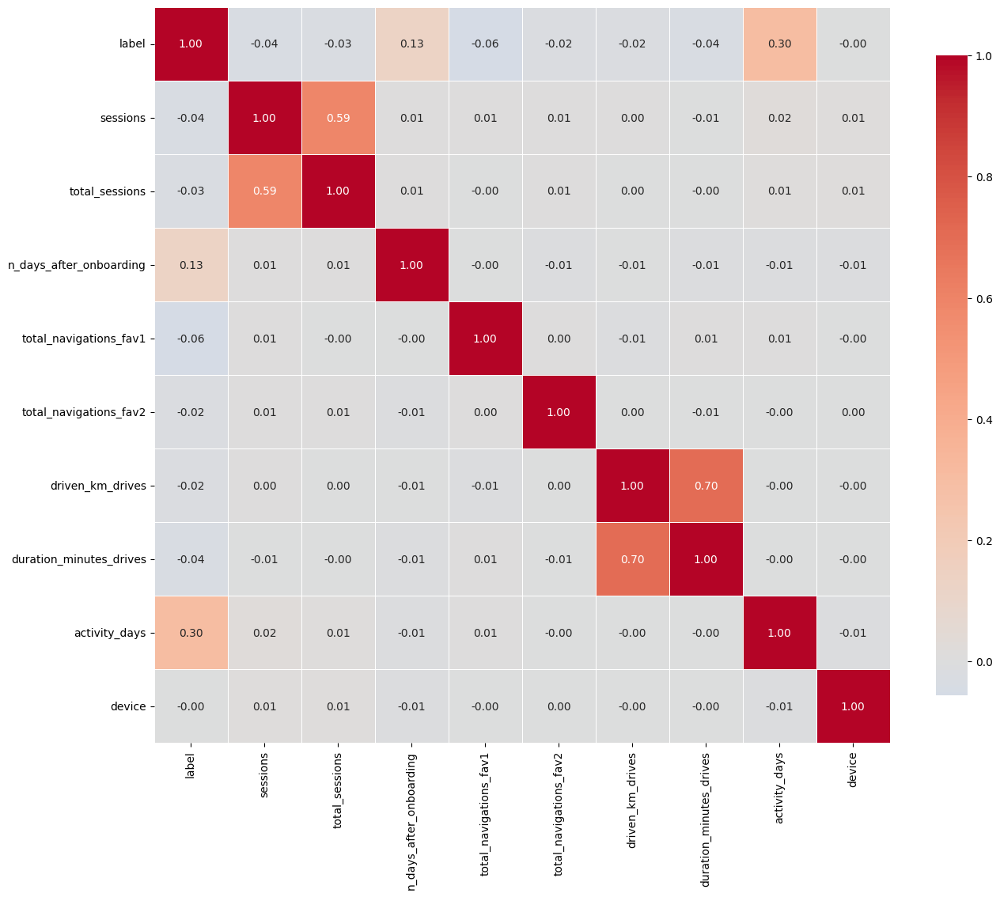

In [ ]:
def correlation_heatmap(df_cleaned):
    correlations = df_cleaned.corr()

    fig, ax = plt.subplots(figsize=(15,15))
    sns.heatmap(correlations,  center=0, fmt='.2f',
                square=True, linewidths=.5, cmap="coolwarm",annot=True, cbar_kws={"shrink": .70})
    plt.show()

correlation_heatmap(df_cleaned)

In [ ]:
df_cleaned['label'].value_counts()

,count
label,
1,11763
0,2536


In [ ]:
X = df_cleaned.drop('label',axis=1)
y = df_cleaned['label']

In [ ]:

#Handling outliers with capping

def replace_outliers_with_min_max(df_cleaned):
    for column in df_cleaned.select_dtypes(include=['float64', 'int64']).columns:
        # Calculate Q1  and Q3

        Q1 = df_cleaned[column].quantile(0.25)
        Q3 = df_cleaned[column].quantile(0.75)

        # Interquartile Range

        IQR = Q3 - Q1


        # Define lower and upper bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Identify outliers
        outliers = (df_cleaned[column] < lower_bound) | (df_cleaned[column] > upper_bound)



        # Replace outliers with the min or max value
        df_cleaned.loc[outliers, column] = df_cleaned[column].clip(lower=lower_bound, upper=upper_bound).max() if df_cleaned[column].max() > df_cleaned[column].min() else df_cleaned[column].min()

    return df_cleaned

# Replace outliers in the DataFrame
X = replace_outliers_with_min_max(X)

# Display cleaned DataFrame
print(X.head())

   sessions  total_sessions  n_days_after_onboarding  total_navigations_fav1  \
0       243      296.748273                     2276                     208   
1       133      326.896596                     1225                      19   
2       114      135.522926                     2651                       0   
3        49       67.589221                       15                     322   
4        84      168.247020                     1562                     166   

   total_navigations_fav2  driven_km_drives  duration_minutes_drives  \
0                     0.0       2628.845068              1985.775061   
1                    64.0       9923.950541              3160.472914   
2                     0.0       3059.148818              1610.735904   
3                     7.0        913.591123               587.196542   
4                     5.0       3950.202008              1219.555924   

   activity_days  device  
0             28       0  
1             13       1  
2    

<ipython-input-227-9e64735d5e38>:25: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '107.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [ ]:

# function to plot categorical features
def countplot(col):
  col_values = df[col].value_counts()
  # plotting
  plt.figure(figsize=(10, 6))
  sns.countplot(x=col, data=df, order=col_values.index, palette='tab10')  # ordered
  plt.title(f'CountPlot of {col} column', fontsize=14, c='k')
  plt.xlabel(col, fontsize=14, c='k')
  plt.ylabel('Counts', fontsize=14, c='k')
  # showing the percenatge
  for i in range(col_values.shape[0]):
    count = col_values[i]
    strt='{:0.2f}%'.format(100*count / df.shape[0])
    plt.text(i, count/2, strt, ha='center', color='black', fontsize=14)

In [ ]:
df_cleaned.shape[0]

14299

<ipython-input-228-a9f832ec83e1>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-228-a9f832ec83e1>:12: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<ipython-input-228-a9f832ec83e1>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-228-a9f832ec83e1>:12: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



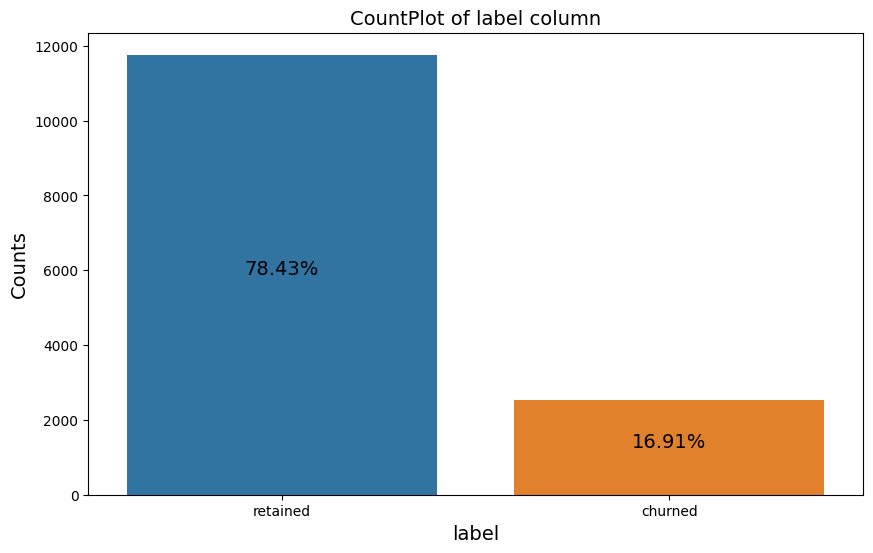

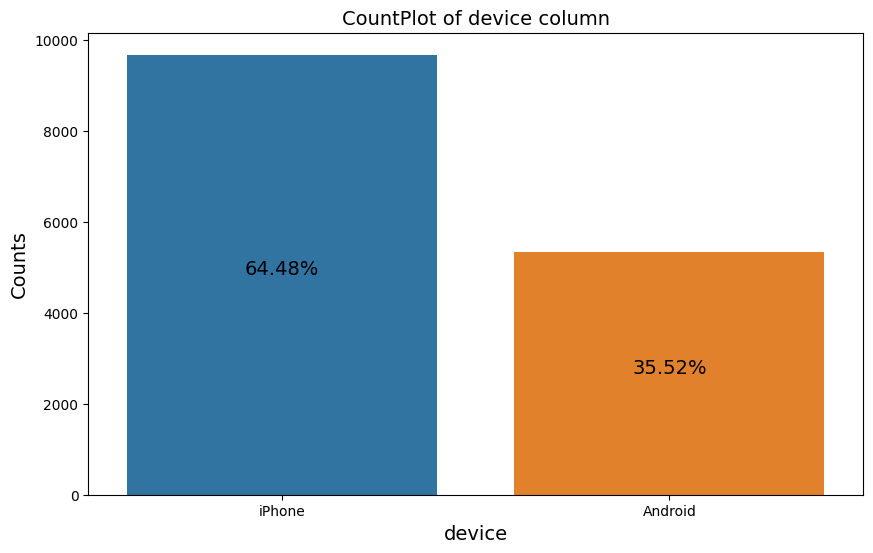

In [ ]:
for i in df_categ:
  countplot(i)

In [ ]:
df.groupby('device')['label'].value_counts()

device   label   
Android  retained    4183
         churned      891
iPhone   retained    7580
         churned     1645
Name: count, dtype: int64

In [ ]:
X.shape

(14299, 9)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, shuffle=True)

In [ ]:
from imblearn.under_sampling import RandomUnderSampler, TomekLinks, ClusterCentroids

# Create an undersampler object
undersampler = RandomUnderSampler()

# Fit and transform the training data
X_resampled, y_resampled = undersampler.fit_resample(X_train, y_train)

In [ ]:
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

In [ ]:
sc = MinMaxScaler()
X_train = sc.fit_transform(X_resampled)
X_test = sc.transform(X_test)

In [ ]:
pca = PCA(n_components=2)  # We want to reduce to 4 dimensions
X_pca = pca.fit_transform(X_train)

X_test_pca = pca.transform(X_test)

In [ ]:
clf = XGBClassifier( max_depth = 8)
clf = clf.fit(X_pca, y_resampled)
y_pred = clf.predict(X_test_pca)
accuracy = clf.score(X_test_pca ,y_test )
accuracy

0.6625874125874126

In [ ]:
svc = SVC(C=1, random_state=42)

In [ ]:
svc.fit(X_pca, y_resampled)
y_pred_1 = svc.predict(X_test_pca)
accuracy = svc.score(X_test_pca, y_test )
accuracy

0.6594405594405595

In [ ]:
print(classification_report(y_test, y_pred_1))


              precision    recall  f1-score   support

           0       0.31      0.72      0.44       523
           1       0.91      0.65      0.76      2337

    accuracy                           0.66      2860
   macro avg       0.61      0.68      0.60      2860
weighted avg       0.80      0.66      0.70      2860



<Axes: >

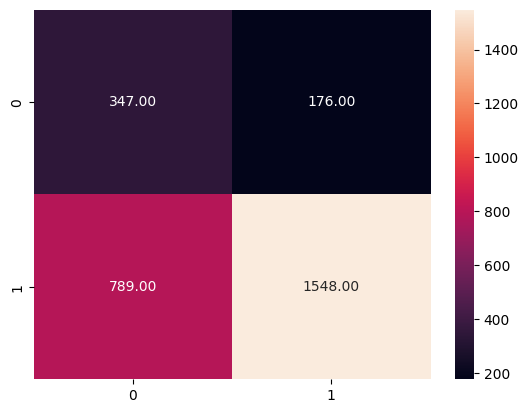

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_pred) ,annot=True, fmt='.2f')
